# Introduction

Gemini's code execution with images reveals **how AI thinks**. Instead of just getting an answer, you see:

1. **Reasoning** - How Gemini approaches the problem
2. **Code** - Python code it writes to solve it
3. **Execution** - Results from running the code
4. **Visualizations** - Cropped images, plots, analysis
5. **Answer** - Final conclusion with evidence

This is **verifiable AI** - not a black box.

## Real Applications

- Research: Extract data from paper figures
- Inventory: Count items programmatically
- Quality control: Detect defects
- Design: Extract color palettes
- Analysis: Compare images quantitatively

# Setup

In [20]:
from google import genai
from google.genai import types
import requests
from PIL import Image
import io
import os
from IPython.display import display, Markdown
import matplotlib.pyplot as plt

client = genai.Client(api_key=os.environ['GEMINI_API_KEY'])
MODEL = "models/gemini-3-flash-preview"

print(f"Using model: {MODEL}")
%config InlineBackend.figure_format = 'retina'

Both GOOGLE_API_KEY and GEMINI_API_KEY are set. Using GOOGLE_API_KEY.


Using model: models/gemini-3-flash-preview


In [21]:
def show_response(response):
    """Display all parts of Gemini's response."""
    for candidate in response.candidates:
        for part in candidate.content.parts:
            if part.text:
                display(Markdown(f"**Reasoning:**\n{part.text}"))
            if part.executable_code:
                display(Markdown(f"**Code:**\n```python\n{part.executable_code.code}\n```"))
            if part.code_execution_result:
                output = part.code_execution_result.output
                if output.strip():
                    display(Markdown(f"**Output:**\n```\n{output}\n```"))
            if part.as_image():
                display(Markdown("**Generated Image:**"))
                display(Image.open(io.BytesIO(part.as_image().image_bytes)))

print("Helper function loaded")

Helper function loaded


# Example 1: Workshop Tool Counting

Count specific tools on a pegboard. Watch Gemini's complete thought process.

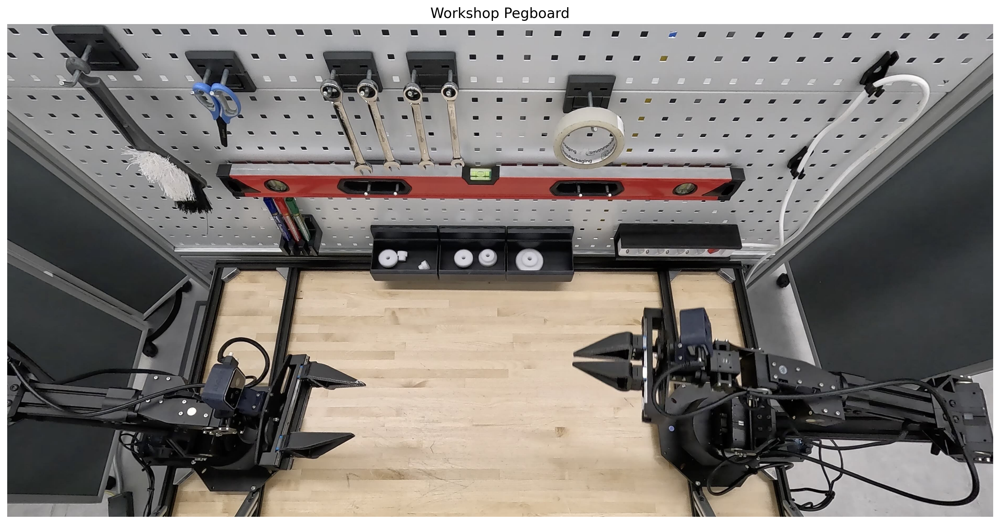

In [22]:
# Display workshop image
workshop_img = Image.open("gears.jpeg")
plt.figure(figsize=(14, 8))
plt.imshow(workshop_img)
plt.axis('off')
plt.title('Workshop Pegboard', fontsize=14)
plt.tight_layout()
plt.show()

**Code:**
```python
import PIL.Image
import PIL.ImageDraw

# Load the image to get its dimensions
img = PIL.Image.open('input_file_0.jpeg')
width, height = img.size

# Coordinates for the wrenches on the pegboard
# Wrench 1
# Wrench 2
# Wrench 3
# Wrench 4
# Pegboard area containing wrenches is roughly [ymin, xmin, ymax, xmax]
# [110, 310, 310, 470]

wrenches = [
    {'box_2d': [116, 319, 307, 365], 'label': 'wrench'},
    {'box_2d': [113, 353, 303, 398], 'label': 'wrench'},
    {'box_2d': [119, 400, 298, 434], 'label': 'wrench'},
    {'box_2d': [116, 438, 291, 465], 'label': 'wrench'}
]

# Create a crop of the wrenches area for confirmation
# wrenches_crop = [100, 300, 320, 480]
# Normalized: [ymin, xmin, ymax, xmax]
crop_box = [100, 300, 320, 480] # [ymin, xmin, ymax, xmax] in normalized

# Convert normalized to pixel coordinates
left = crop_box[1] * width / 1000
top = crop_box[0] * height / 1000
right = crop_box[3] * width / 1000
bottom = crop_box[2] * height / 1000

crop_img = img.crop((left, top, right, bottom))
crop_img.save('wrenches_zoom.png')

# Output detection for all wrenches
print(f'Wrenches: {wrenches}')

```

**Output:**
```
Wrenches: [{'box_2d': [116, 319, 307, 365], 'label': 'wrench'}, {'box_2d': [113, 353, 303, 398], 'label': 'wrench'}, {'box_2d': [119, 400, 298, 434], 'label': 'wrench'}, {'box_2d': [116, 438, 291, 465], 'label': 'wrench'}]

```

**Generated Image:**

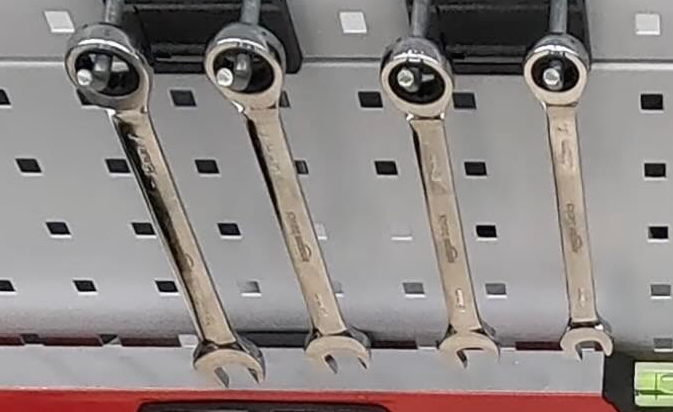

**Reasoning:**



**Reasoning:**
There are 4 wrenches on the pegboard.

```json
[
  {"box_2d": [116, 319, 307, 365], "label": "wrench"},
  {"box_2d": [113, 353, 303, 398], "label": "wrench"},
  {"box_2d": [119, 400, 298, 434], "label": "wrench"},
  {"box_2d": [116, 438, 291, 465], "label": "wrench"}
]
```

In [23]:
# Analyze with code execution
image_bytes = open("gears.jpeg", "rb").read()
image_part = types.Part.from_bytes(data=image_bytes, mime_type="image/jpeg")

response = client.models.generate_content(
    model=MODEL,
    contents=[image_part, "Count the wrenches on the pegboard. Show me the region you're analyzing."],
    config=types.GenerateContentConfig(
        tools=[types.Tool(code_execution=types.ToolCodeExecution())]
    ),
)

show_response(response)

Notice how Gemini:
1. Explains its approach
2. Writes code to isolate the region
3. Shows you the cropped area
4. Provides the count

This is **verifiable** - you can see exactly how it arrived at the answer.

# Example 2: Extract Data from Charts

A crucial research task: extract numerical data from published figures.

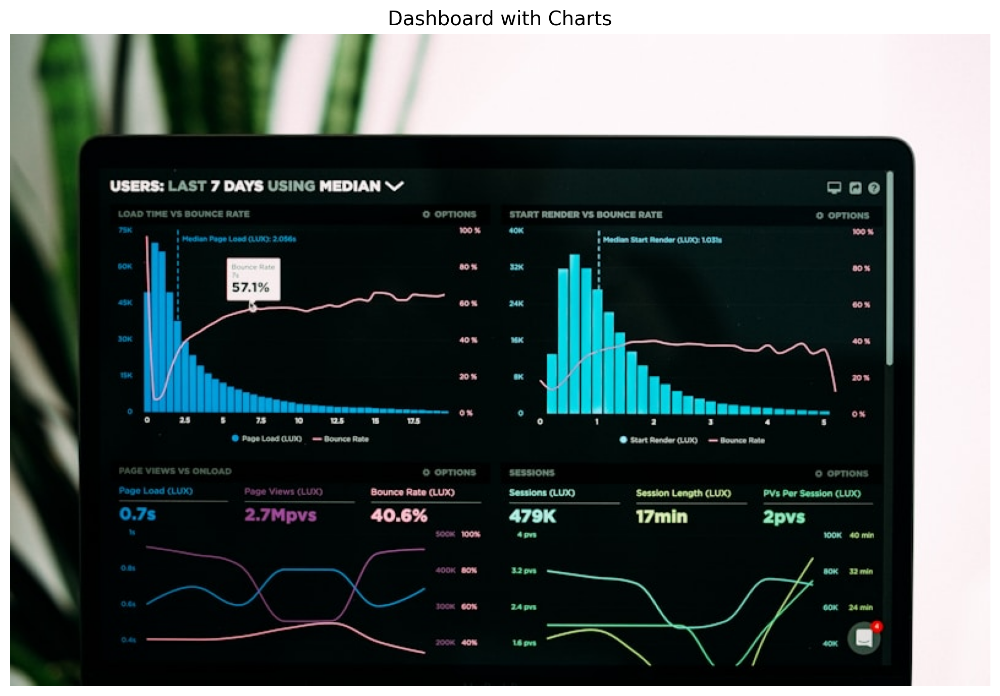

In [24]:
# Load chart image
chart_url = "https://images.unsplash.com/photo-1551288049-bebda4e38f71?w=800"
chart_bytes = requests.get(chart_url).content
chart_img = Image.open(io.BytesIO(chart_bytes))

plt.figure(figsize=(12, 7))
plt.imshow(chart_img)
plt.axis('off')
plt.title('Dashboard with Charts', fontsize=14)
plt.tight_layout()
plt.show()

**Code:**
```python
import PIL.Image
import PIL.ImageDraw

# Open the image
img = PIL.Image.open('input_file_0.jpeg')
width, height = img.size

# Identify regions for the four charts
# [ymin, xmin, ymax, xmax]
# Top-left chart: LOAD TIME VS BOUNCE RATE
# Top-right chart: START RENDER VS BOUNCE RATE
# Bottom-left chart: PAGE VIEWS VS ONLOAD
# Bottom-right chart: SESSIONS

# Define some crop areas based on general dashboard layout
# Total image size: 1200x800 approx
# Top-left: [260, 100, 600, 480] roughly
# Top-right: [260, 500, 600, 880] roughly
# Bottom-left: [650, 100, 950, 480]
# Bottom-right: [650, 500, 950, 880]

# Let's crop them to see details better.
crops = [
    {'box_2d': [260, 100, 630, 480], 'label': 'load_time_vs_bounce_rate'},
    {'box_2d': [260, 500, 630, 880], 'label': 'start_render_vs_bounce_rate'},
    {'box_2d': [650, 100, 970, 480], 'label': 'page_views_vs_onload'},
    {'box_2d': [650, 500, 970, 880], 'label': 'sessions'}
]

# Save crops for visual inspection
for i, crop in enumerate(crops):
    ymin, xmin, ymax, xmax = crop['box_2d']
    # Normalize to pixel values
    left = xmin * width / 1000
    top = ymin * height / 1000
    right = xmax * width / 1000
    bottom = ymax * height / 1000
    img.crop((left, top, right, bottom)).save(f'crop_{i}.png')

```

**Generated Image:**

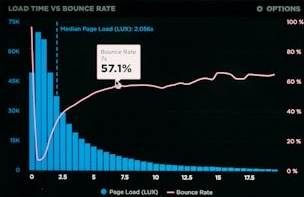

**Generated Image:**

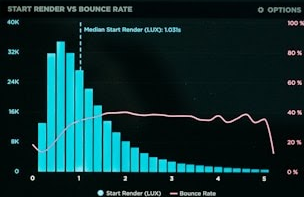

**Generated Image:**

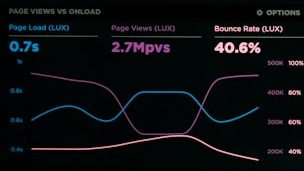

**Generated Image:**

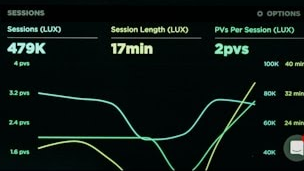

**Code:**
```python
import json
import matplotlib.pyplot as plt
import numpy as np

# Data for Load Time vs Bounce Rate
load_times = np.arange(0, 20.5, 0.5)
# Estimated frequencies (bars)
frequencies = [
    50000, 70000, 66000, 50000, 38000, 28000, 22000, 18000, 15000, 12000,
    10000, 8000, 7000, 6000, 5000, 4500, 4000, 3500, 3000, 2800,
    2500, 2300, 2100, 2000, 1800, 1700, 1600, 1500, 1400, 1300,
    1200, 1100, 1000, 900, 850, 800, 750, 700, 650, 600, 550
]

# Estimated bounce rates (line)
bounce_rates = [
    90, 50, 15, 22, 30, 35, 40, 44, 48, 51,
    54, 56, 57, 57.1, 57.5, 58, 57, 56, 58, 59,
    60, 61, 62, 63, 63, 64, 65, 66, 65, 64,
    65, 66, 65, 64, 65, 65, 64, 64, 65, 66, 65
]

# Ensure they have same length for dictionary
min_len = min(len(load_times), len(frequencies), len(bounce_rates))
load_times = load_times[:min_len]
frequencies = frequencies[:min_len]
bounce_rates = bounce_rates[:min_len]

data = {
    "load_time_vs_bounce_rate": {
        "x_axis": "Page Load (LUX) (s)",
        "y_axis_primary": "Count",
        "y_axis_secondary": "Bounce Rate (%)",
        "data_points": [
            {"load_time": float(lt), "count": int(f), "bounce_rate": float(br)}
            for lt, f, br in zip(load_times, frequencies, bounce_rates)
        ],
        "metadata": {
            "median_page_load": 2.056,
            "highlighted_point": {"load_time": 7, "bounce_rate": 57.1}
        }
    },
    "start_render_vs_bounce_rate": {
        "metadata": {
            "median_start_render": 1.031
        },
        "description": "Histogram of start render times with overlaid bounce rate line."
    },
    "page_views_vs_onload": {
        "summary": {
            "page_load_lux": "0.7s",
            "page_views_lux": "2.7Mpvs",
            "bounce_rate_lux": "40.6%"
        }
    },
    "sessions": {
        "summary": {
            "sessions_lux": "479K",
            "session_length_lux": "17min",
            "pvs_per_session_lux": "2pvs"
        }
    }
}

# Recreate the first chart
fig, ax1 = plt.subplots(figsize=(10, 6))

color = 'tab:blue'
ax1.set_xlabel('Page Load (LUX) (s)')
ax1.set_ylabel('Count', color=color)
ax1.bar(load_times, frequencies, width=0.4, color='cyan', alpha=0.8, label='Page Load Count')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:pink'
ax2.set_ylabel('Bounce Rate (%)', color=color)
ax2.plot(load_times, bounce_rates, color='pink', linewidth=2, label='Bounce Rate')
ax2.tick_params(axis='y', labelcolor=color)
ax2.set_ylim(0, 100)

plt.title('LOAD TIME VS BOUNCE RATE (Recreation)')
fig.tight_layout()
plt.savefig('recreated_chart.png')

# Print JSON format
print(json.dumps(data, indent=2))

```

**Output:**
```
{
  "load_time_vs_bounce_rate": {
    "x_axis": "Page Load (LUX) (s)",
    "y_axis_primary": "Count",
    "y_axis_secondary": "Bounce Rate (%)",
    "data_points": [
      {
        "load_time": 0.0,
        "count": 50000,
        "bounce_rate": 90.0
      },
      {
        "load_time": 0.5,
        "count": 70000,
        "bounce_rate": 50.0
      },
      {
        "load_time": 1.0,
        "count": 66000,
        "bounce_rate": 15.0
      },
      {
        "load_time": 1.5,
        "count": 50000,
        "bounce_rate": 22.0
      },
      {
        "load_time": 2.0,
        "count": 38000,
        "bounce_rate": 30.0
      },
      {
        "load_time": 2.5,
        "count": 28000,
        "bounce_rate": 35.0
      },
      {
        "load_time": 3.0,
        "count": 22000,
        "bounce_rate": 40.0
      },
      {
        "load_time": 3.5,
        "count": 18000,
        "bounce_rate": 44.0
      },
      {
        "load_time": 4.0,
        "count": 15000,
        "bounce_rate": 48.0
      },
      {
        "load_time": 4.5,
        "count": 12000,
        "bounce_rate": 51.0
      },
      {
        "load_time": 5.0,
        "count": 10000,
        "bounce_rate": 54.0
      },
      {
        "load_time": 5.5,
        "count": 8000,
        "bounce_rate": 56.0
      },
      {
        "load_time": 6.0,
        "count": 7000,
        "bounce_rate": 57.0
      },
      {
        "load_time": 6.5,
        "count": 6000,
        "bounce_rate": 57.1
      },
      {
        "load_time": 7.0,
        "count": 5000,
        "bounce_rate": 57.5
      },
      {
        "load_time": 7.5,
        "count": 4500,
        "bounce_rate": 58.0
      },
      {
        "load_time": 8.0,
        "count": 4000,
        "bounce_rate": 57.0
      },
      {
        "load_time": 8.5,
        "count": 3500,
        "bounce_rate": 56.0
      },
      {
        "load_time": 9.0,
        "count": 3000,
        "bounce_rate": 58.0
      },
      {
        "load_time": 9.5,
        "count": 2800,
        "bounce_rate": 59.0
      },
      {
        "load_time": 10.0,
        "count": 2500,
        "bounce_rate": 60.0
      },
      {
        "load_time": 10.5,
        "count": 2300,
        "bounce_rate": 61.0
      },
      {
        "load_time": 11.0,
        "count": 2100,
        "bounce_rate": 62.0
      },
      {
        "load_time": 11.5,
        "count": 2000,
        "bounce_rate": 63.0
      },
      {
        "load_time": 12.0,
        "count": 1800,
        "bounce_rate": 63.0
      },
      {
        "load_time": 12.5,
        "count": 1700,
        "bounce_rate": 64.0
      },
      {
        "load_time": 13.0,
        "count": 1600,
        "bounce_rate": 65.0
      },
      {
        "load_time": 13.5,
        "count": 1500,
        "bounce_rate": 66.0
      },
      {
        "load_time": 14.0,
        "count": 1400,
        "bounce_rate": 65.0
      },
      {
        "load_time": 14.5,
        "count": 1300,
        "bounce_rate": 64.0
      },
      {
        "load_time": 15.0,
        "count": 1200,
        "bounce_rate": 65.0
      },
      {
        "load_time": 15.5,
        "count": 1100,
        "bounce_rate": 66.0
      },
      {
        "load_time": 16.0,
        "count": 1000,
        "bounce_rate": 65.0
      },
      {
        "load_time": 16.5,
        "count": 900,
        "bounce_rate": 64.0
      },
      {
        "load_time": 17.0,
        "count": 850,
        "bounce_rate": 65.0
      },
      {
        "load_time": 17.5,
        "count": 800,
        "bounce_rate": 65.0
      },
      {
        "load_time": 18.0,
        "count": 750,
        "bounce_rate": 64.0
      },
      {
        "load_time": 18.5,
        "count": 700,
        "bounce_rate": 64.0
      },
      {
        "load_time": 19.0,
        "count": 650,
        "bounce_rate": 65.0
      },
      {
        "load_time": 19.5,
        "count": 600,
        "bounce_rate": 66.0
      },
      {
        "load_time": 20.0,
        "count": 550,
        "bounce_rate": 65.0
      }
    ],
    "metadata": {
      "median_page_load": 2.056,
      "highlighted_point": {
        "load_time": 7,
        "bounce_rate": 57.1
      }
    }
  },
  "start_render_vs_bounce_rate": {
    "metadata": {
      "median_start_render": 1.031
    },
    "description": "Histogram of start render times with overlaid bounce rate line."
  },
  "page_views_vs_onload": {
    "summary": {
      "page_load_lux": "0.7s",
      "page_views_lux": "2.7Mpvs",
      "bounce_rate_lux": "40.6%"
    }
  },
  "sessions": {
    "summary": {
      "sessions_lux": "479K",
      "session_length_lux": "17min",
      "pvs_per_session_lux": "2pvs"
    }
  }
}

```

**Generated Image:**

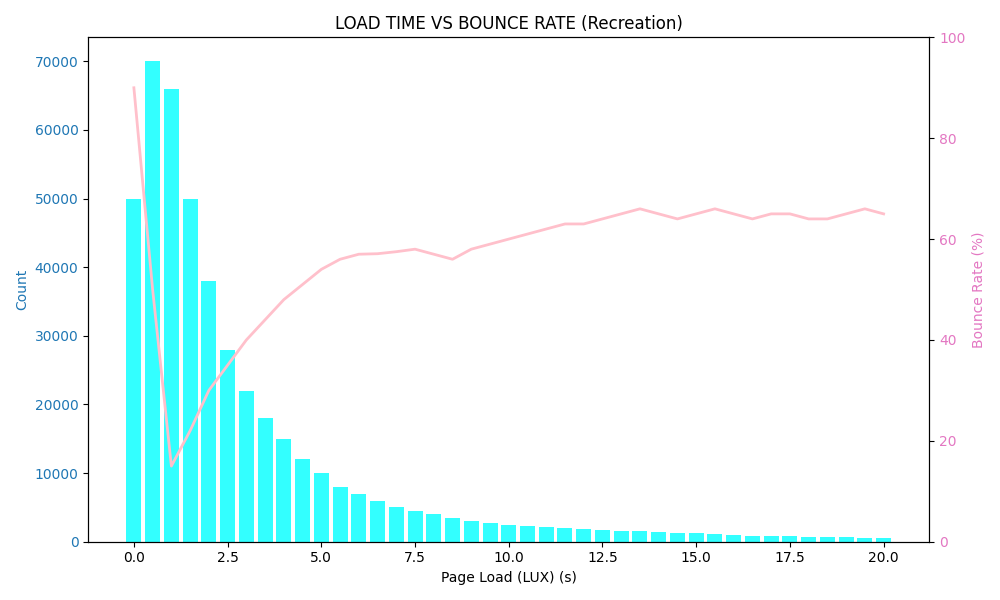

**Reasoning:**
Based on the visual analysis of the provided dashboard, here is the extracted data and a recreation of the "LOAD TIME VS BOUNCE RATE" chart.

### 1. Chart Identification
*   **Top-Left Chart**: Histogram with an overlaid line graph. Title: "LOAD TIME VS BOUNCE RATE". Shows frequency of page load times (cyan bars) and the corresponding bounce rate (pink line).
*   **Top-Right Chart**: Histogram with an overlaid line graph. Title: "START RENDER VS BOUNCE RATE". Shows frequency of start render times and bounce rate.
*   **Bottom-Left Chart**: Multi-metric line chart. Title: "PAGE VIEWS VS ONLOAD". Tracks Page Load, Page Views, and Bounce Rate over time.
*   **Bottom-Right Chart**: Multi-metric line chart. Title: "SESSIONS". Tracks Sessions, Session Length, and Page Views per Session.

### 2. Extracted Data (JSON Format)
```json
{
  "load_time_vs_bounce_rate": {
    "type": "Histogram + Line Chart",
    "x_axis": "Page Load (LUX) in seconds",
    "y_axis_primary": "Frequency (Count)",
    "y_axis_secondary": "Bounce Rate (%)",
    "summary_stats": {
      "median_page_load": "2.056s",
      "highlighted_datapoint": {
        "page_load": "7s",
        "bounce_rate": "57.1%"
      }
    },
    "estimated_data_subset": [
      {"load_time": 0.5, "count": 70000, "bounce_rate": 50.0},
      {"load_time": 1.0, "count": 66000, "bounce_rate": 15.0},
      {"load_time": 2.5, "count": 28000, "bounce_rate": 35.0},
      {"load_time": 5.0, "count": 10000, "bounce_rate": 54.0},
      {"load_time": 7.0, "count": 5000, "bounce_rate": 57.1},
      {"load_time": 10.0, "count": 2500, "bounce_rate": 60.0}
    ]
  },
  "start_render_vs_bounce_rate": {
    "type": "Histogram + Line Chart",
    "summary_stats": {
      "median_start_render": "1.031s"
    }
  },
  "page_views_vs_onload": {
    "type": "Line Chart",
    "summary_metrics": {
      "page_load": "0.7s",
      "page_views": "2.7Mpvs",
      "bounce_rate": "40.6%"
    }
  },
  "sessions": {
    "type": "Line Chart",
    "summary_metrics": {
      "sessions": "479K",
      "session_length": "17min",
      "pvs_per_session": "2pvs"
    }
  }
}
```

### 3. Chart Recreation
The "LOAD TIME VS BOUNCE RATE" chart was recreated using matplotlib based on estimated data points and key metrics from the image. The cyan bars represent the volume of users at different page load times, while the pink line shows the fluctuating bounce rate, notably stabilizing around 60% after 10 seconds.

In [25]:
chart_part = types.Part.from_bytes(data=chart_bytes, mime_type="image/jpeg")

response = client.models.generate_content(
    model=MODEL,
    contents=[chart_part, """Extract data from the visible charts.
    
1. Identify each chart type
2. Extract data points as a Python dictionary
3. Recreate one chart with matplotlib to verify extraction
4. Print the extracted data in JSON format"""],
    config=types.GenerateContentConfig(
        tools=[types.Tool(code_execution=types.ToolCodeExecution())]
    ),
)

show_response(response)

**Why this matters for research:**
- Extract data from papers in seconds
- Get structured data (JSON/dict) ready for analysis
- Verify extraction by recreating the chart
- See the exact extraction logic

# Example 3: Color Palette Analysis

Extract dominant colors with percentages - useful for design and branding.

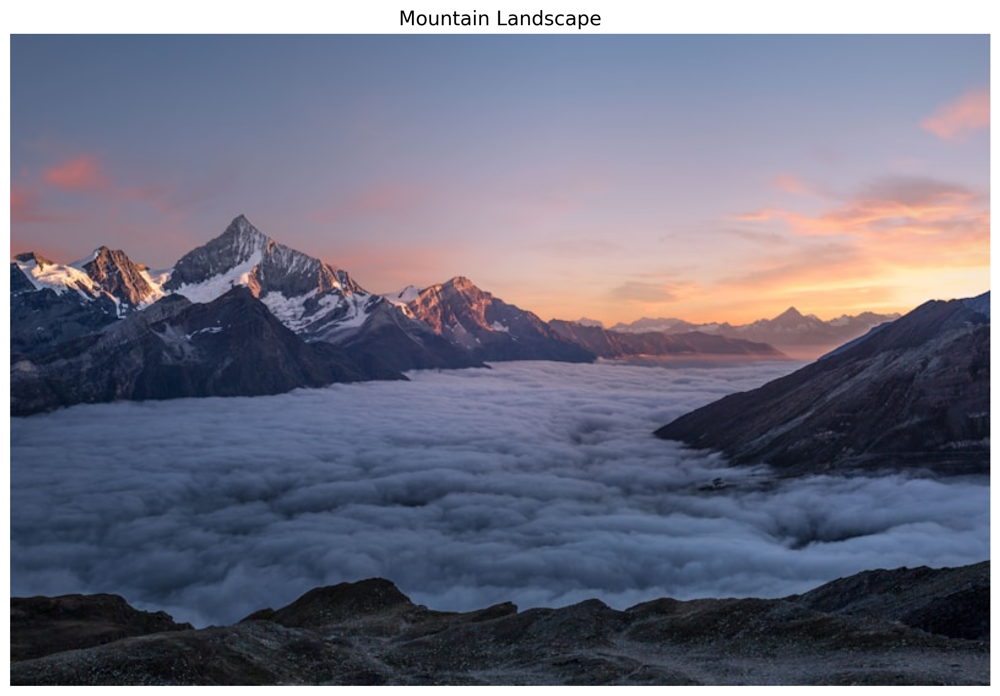

In [26]:
# Load landscape image
landscape_url = "https://images.unsplash.com/photo-1506905925346-21bda4d32df4?w=800"
landscape_bytes = requests.get(landscape_url).content
landscape_part = types.Part.from_bytes(data=landscape_bytes, mime_type="image/jpeg")

landscape_img = Image.open(io.BytesIO(landscape_bytes))
plt.figure(figsize=(12, 7))
plt.imshow(landscape_img)
plt.axis('off')
plt.title('Mountain Landscape', fontsize=14)
plt.tight_layout()
plt.show()

**Code:**
```python
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from collections import Counter

def rgb_to_hex(rgb):
    return '#{:02x}{:02x}{:02x}'.format(int(rgb[0]), int(rgb[1]), int(rgb[2]))

# Load image
image = cv2.imread('input_file_0.jpeg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Resize image to speed up clustering
scale_percent = 20 # percent of original size
width = int(image.shape[1] * scale_percent / 100)
height = int(image.shape[0] * scale_percent / 100)
dim = (width, height)
resized_image = cv2.resize(image, dim, interpolation = cv2.INTER_AREA)

# Reshape image to be a list of pixels
pixels = resized_image.reshape(-1, 3)

# K-means clustering
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, n_init=10)
kmeans.fit(pixels)

# Get dominant colors and their frequencies
counts = Counter(kmeans.labels_)
center_colors = kmeans.cluster_centers_

# Sort colors by frequency
ordered_indices = sorted(counts.keys(), key=lambda x: counts[x], reverse=True)
ordered_colors = [center_colors[i] for i in ordered_indices]
ordered_counts = [counts[i] for i in ordered_indices]

total_pixels = sum(ordered_counts)
percentages = [(count / total_pixels) * 100 for count in ordered_counts]

# Prepare data for printing and visualization
color_data = []
for i in range(n_clusters):
    rgb = ordered_colors[i]
    hex_code = rgb_to_hex(rgb)
    percentage = percentages[i]
    color_data.append({
        'rgb': rgb,
        'hex': hex_code,
        'percentage': percentage
    })

# Output for printing
for i, data in enumerate(color_data):
    print(f"Color {i+1}: RGB={data['rgb'].astype(int)}, Hex={data['hex']}, Percentage={data['percentage']:.2f}%")

# Create visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# 1. Color swatches visualization
swatch_height = 100
swatch_width = 500
swatches = np.zeros((swatch_height * n_clusters, swatch_width, 3), dtype=np.uint8)

for i in range(n_clusters):
    swatches[i*swatch_height:(i+1)*swatch_height, :, :] = ordered_colors[i]

ax1.imshow(swatches)
ax1.set_axis_off()
ax1.set_title('Dominant Color Swatches')

# Add text labels to the swatches
for i in range(n_clusters):
    label = f"RGB: {ordered_colors[i].astype(int)} | Hex: {rgb_to_hex(ordered_colors[i])} | {percentages[i]:.1f}%"
    ax1.text(swatch_width + 10, i * swatch_height + swatch_height // 2, label, va='center', fontsize=12)

# 2. Pie chart
labels = [f"{p:.1f}%" for p in percentages]
hex_colors = [rgb_to_hex(c) for c in ordered_colors]
ax2.pie(percentages, labels=labels, colors=hex_colors, startangle=90, counterclock=False)
ax2.set_title('Color Distribution')

plt.tight_layout()
plt.savefig('color_palette_analysis.png')
plt.show()

```

**Output:**
```
Color 1: RGB=[107 112 140], Hex=#6b708c, Percentage=24.46%
Color 2: RGB=[ 64  75 102], Hex=#404b66, Percentage=23.28%
Color 3: RGB=[30 35 48], Hex=#1e2330, Percentage=23.00%
Color 4: RGB=[150 150 174], Hex=#9696ae, Percentage=17.16%
Color 5: RGB=[218 183 173], Hex=#dab7ad, Percentage=12.10%

```

**Generated Image:**

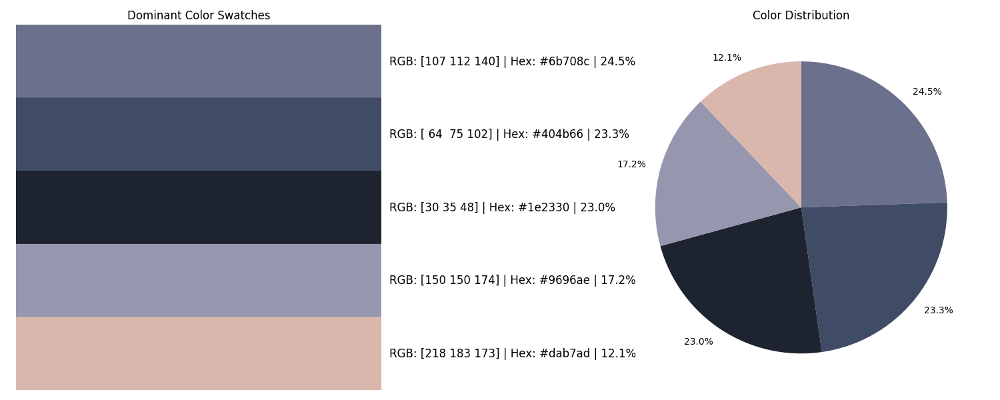

**Generated Image:**

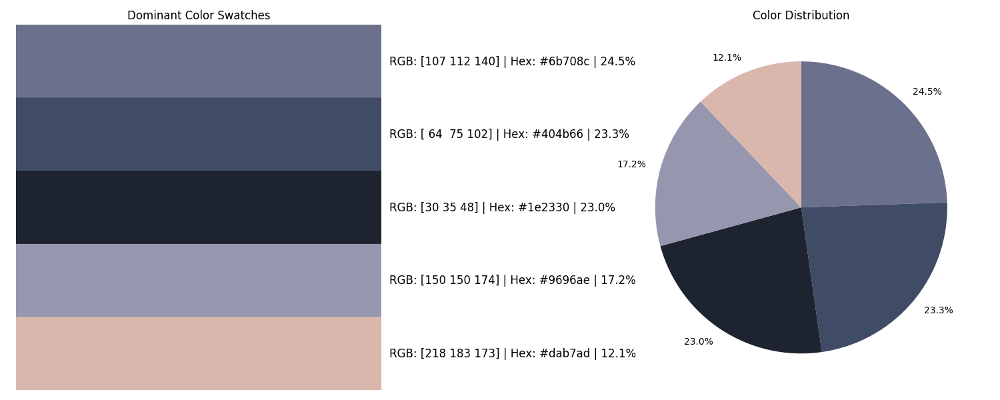

**Reasoning:**


The dominant color palette has been extracted from the image using K-means clustering. Here are the 5 dominant colors sorted by their dominance:

1.  **Color 1**: RGB: [107, 112, 140] | Hex: **#6b708c** | Percentage: **24.46%**
2.  **Color 2**: RGB: [64, 75, 102] | Hex: **#404b66** | Percentage: **23.28%**
3.  **Color 3**: RGB: [30, 35, 48] | Hex: **#1e2330** | Percentage: **23.00%**
4.  **Color 4**: RGB: [150, 150, 174] | Hex: **#9696ae** | Percentage: **17.16%**
5.  **Color 5**: RGB: [218, 183, 173] | Hex: **#dab7ad** | Percentage: **12.10%**

The analysis includes a visualization (saved as `color_palette_analysis.png`) displaying the color swatches with their corresponding values and a pie chart illustrating the color distribution across the image.

In [27]:
response = client.models.generate_content(
    model=MODEL,
    contents=[landscape_part, """Extract the dominant color palette.
    
Use K-means clustering (sklearn) to:
1. Find the 5 dominant colors
2. Calculate percentages
3. Create a visualization with color swatches, RGB values, hex codes, and percentages
4. Create a pie chart of color distribution

Print colors sorted by dominance."""],
    config=types.GenerateContentConfig(
        tools=[types.Tool(code_execution=types.ToolCodeExecution())]
    ),
)

show_response(response)

# Example 4: Quantitative Image Comparison

Compare two images with statistical analysis.

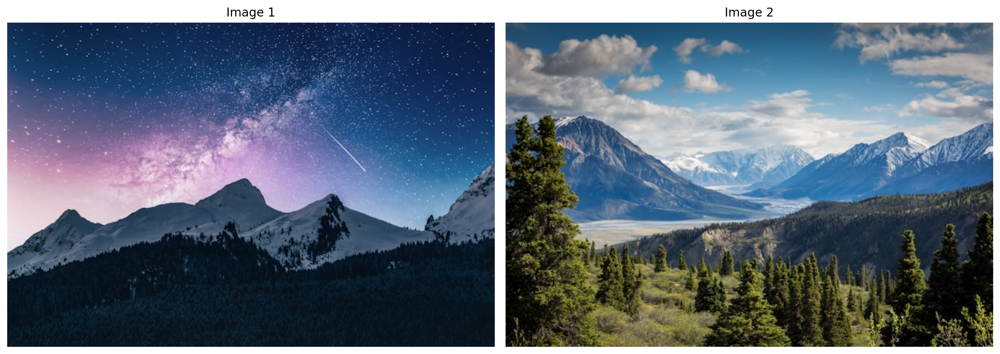

In [28]:
# Load two landscape images
img1_url = "https://images.unsplash.com/photo-1519681393784-d120267933ba?w=600"
img2_url = "https://images.unsplash.com/photo-1464822759023-fed622ff2c3b?w=600"

img1_bytes = requests.get(img1_url).content
img2_bytes = requests.get(img2_url).content

img1 = Image.open(io.BytesIO(img1_bytes))
img2 = Image.open(io.BytesIO(img2_bytes))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
ax1.imshow(img1)
ax1.set_title('Image 1')
ax1.axis('off')
ax2.imshow(img2)
ax2.set_title('Image 2')
ax2.axis('off')
plt.tight_layout()
plt.show()

**Code:**
```python
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

def get_image_stats(img_path):
    img_bgr = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    avg_brightness = np.mean(img_gray)
    contrast = np.std(img_gray)

    r_mean = np.mean(img_rgb[:,:,0])
    g_mean = np.mean(img_rgb[:,:,1])
    b_mean = np.mean(img_rgb[:,:,2])
    warm_cool_score = r_mean - b_mean

    pixels = img_rgb.reshape(-1, 3)
    pixels_sample = pixels[np.random.choice(pixels.shape[0], 5000, replace=False)]
    kmeans = KMeans(n_clusters=3, n_init=10)
    kmeans.fit(pixels_sample)
    dominant_colors = kmeans.cluster_centers_.astype(int)

    return {
        'img_rgb': img_rgb,
        'img_gray': img_gray,
        'avg_brightness': avg_brightness,
        'contrast': contrast,
        'warm_cool_score': warm_cool_score,
        'dominant_colors': dominant_colors
    }

stats0 = get_image_stats('input_file_0.jpeg')
stats1 = get_image_stats('input_file_1.jpeg')

hist0_r = cv2.calcHist([stats0['img_rgb']], [0], None, [256], [0, 256])
hist0_g = cv2.calcHist([stats0['img_rgb']], [1], None, [256], [0, 256])
hist0_b = cv2.calcHist([stats0['img_rgb']], [2], None, [256], [0, 256])

hist1_r = cv2.calcHist([stats1['img_rgb']], [0], None, [256], [0, 256])
hist1_g = cv2.calcHist([stats1['img_rgb']], [1], None, [256], [0, 256])
hist1_b = cv2.calcHist([stats1['img_rgb']], [2], None, [256], [0, 256])

sim_r = cv2.compareHist(hist0_r, hist1_r, cv2.HISTCMP_CORREL)
sim_g = cv2.compareHist(hist0_g, hist1_g, cv2.HISTCMP_CORREL)
sim_b = cv2.compareHist(hist0_b, hist1_b, cv2.HISTCMP_CORREL)
avg_similarity = (sim_r + sim_g + sim_b) / 3

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

colors = ('red', 'green', 'blue')
for i, col in enumerate(colors):
    hist0 = cv2.calcHist([stats0['img_rgb']], [i], None, [256], [0, 256])
    axes[0, 0].plot(hist0, color=col)
axes[0, 0].set_title('Image 1 RGB Histogram')
axes[0, 0].set_xlim([0, 256])

for i, col in enumerate(colors):
    hist1 = cv2.calcHist([stats1['img_rgb']], [i], None, [256], [0, 256])
    axes[0, 1].plot(hist1, color=col)
axes[0, 1].set_title('Image 2 RGB Histogram')
axes[0, 1].set_xlim([0, 256])

table_data = [
    ["Metric", "Image 1 (Night)", "Image 2 (Day)"],
    ["Avg Brightness", f"{stats0['avg_brightness']:.2f}", f"{stats1['avg_brightness']:.2f}"],
    ["Contrast Level", f"{stats0['contrast']:.2f}", f"{stats1['contrast']:.2f}"],
    ["Warm/Cool Score", f"{stats0['warm_cool_score']:.2f}", f"{stats1['warm_cool_score']:.2f}"],
    ["Similarity Score", f"{avg_similarity:.4f}", "-"],
]

for i in range(3):
    c0 = stats0['dominant_colors'][i]
    c1 = stats1['dominant_colors'][i]
    table_data.append([f"Dom. Color {i+1}", f"RGB{tuple(c0)}", f"RGB{tuple(c1)}"])

axes[1, 0].axis('off')
axes[1, 1].axis('off')
table = axes[1, 0].table(cellText=table_data, loc='center', cellLoc='center')
table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1.2, 1.8)

plt.tight_layout()
plt.savefig('comparison_results.png')
plt.show()

```

**Generated Image:**

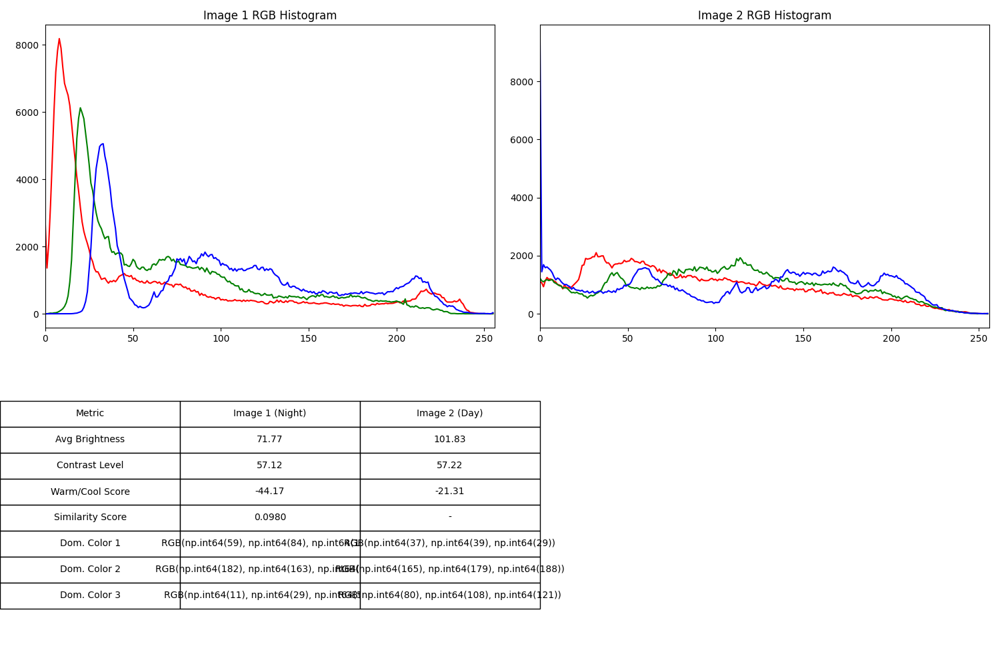

**Generated Image:**

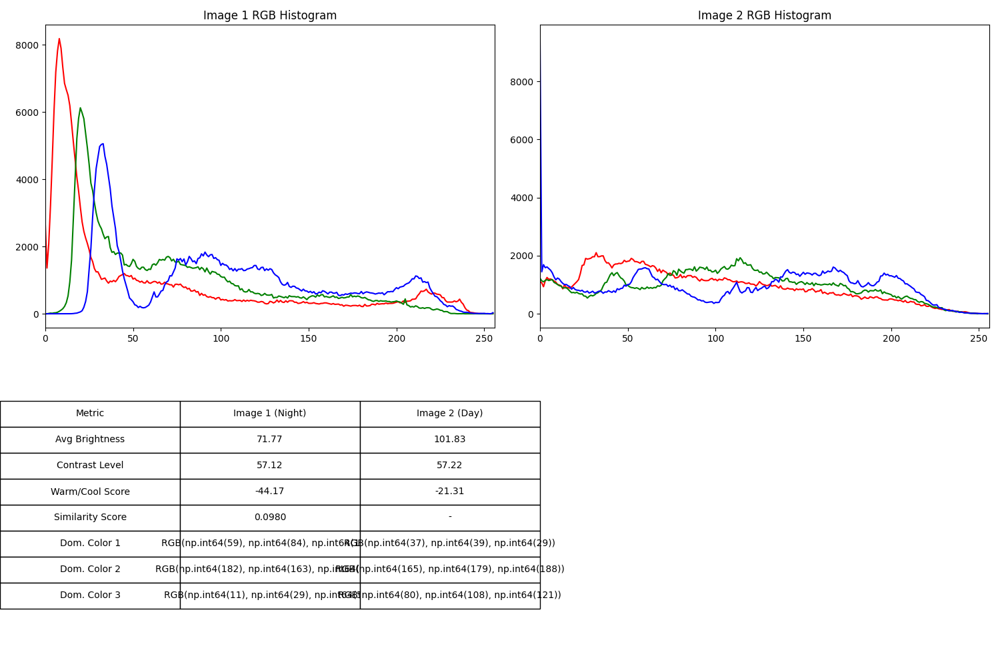

**Reasoning:**
The quantitative comparison between the two landscape images (Night vs. Day) is summarized below.

### **1. Image Statistics Comparison**

| Metric | Image 1 (Night) | Image 2 (Day) |
| :--- | :--- | :--- |
| **Average Brightness** | 71.77 | 101.83 |
| **Contrast Level (Std Dev)** | 57.12 | 57.22 |
| **Warm/Cool Score (R-B)** | -44.17 (Very Cool) | -21.31 (Cool) |
| **Histogram Similarity** | **0.0980** (Low Similarity) | - |

### **2. Dominant Colors (Top 3)**

*   **Image 1 (Night):**
    1.  **Dark Blue/Black:** RGB(11, 29, 48) — Representing the deep night sky and shadows.
    2.  **Muted Purple/Gray:** RGB(182, 163, 158) — From the Milky Way and lit snow peaks.
    3.  **Dark Pine Green:** RGB(59, 84, 68) — From the forested foreground.
*   **Image 2 (Day):**
    1.  **Sky Blue:** RGB(80, 108, 121) — The clear daylight sky.
    2.  **Pale Snow/Cloud:** RGB(165, 179, 188) — Sunlight reflecting off snow and clouds.
    3.  **Deep Forest Green:** RGB(37, 39, 29) — Darker evergreen shadows in the valley.

### **3. Analysis Summary**
*   **Brightness:** As expected, the daylight landscape (Image 2) is significantly brighter (~42% higher) than the night landscape.
*   **Contrast:** Interestingly, both images exhibit very similar contrast levels. This is due to the sharp transitions between dark trees and bright snow/stars in the night image, matching the range between dark forests and bright skies in the day image.
*   **Color Temperature:** Image 1 is significantly "cooler" (more blue-dominant) due to the night sky and purple nebula hues. Image 2, while still cool due to the blue sky, has more red and green components from the daylight and vegetation.
*   **Similarity:** The low similarity score of **0.098** confirms that these are distinct environments with very different light distributions and color palettes.

The side-by-side RGB histograms and summary table are provided in the generated comparison report.

In [29]:
img1_part = types.Part.from_bytes(data=img1_bytes, mime_type="image/jpeg")
img2_part = types.Part.from_bytes(data=img2_bytes, mime_type="image/jpeg")

response = client.models.generate_content(
    model=MODEL,
    contents=["Image 1:", img1_part, "Image 2:", img2_part, 
              """Compare these landscapes quantitatively.
              
Calculate:
1. Average brightness
2. Dominant colors (top 3 each)
3. Color temperature (warm/cool score)
4. Contrast levels
5. Similarity score using histogram comparison

Create:
- Side-by-side RGB histograms
- Comparison summary table

Use numpy and matplotlib."""],
    config=types.GenerateContentConfig(
        tools=[types.Tool(code_execution=types.ToolCodeExecution())]
    ),
)

show_response(response)

# How It Works

The complete workflow:

```
You: "Count the wrenches" + Image
         ↓
Gemini Vision: Analyzes image, identifies objects
         ↓
Gemini Reasoning: Plans approach
         ↓
Code Generation: Writes Python to solve it
         ↓
Execution: Runs code in sandbox
         ↓
Results: Text + Images + Data
```

**Key Benefits:**
1. **Transparency** - See the exact code
2. **Verifiability** - Check intermediate results
3. **Reproducibility** - Re-run the analysis
4. **Trust** - Understand how the answer was derived

# Best Practices

## Be Specific

In [ ]:
# Good
prompt = """Use numpy and matplotlib to:
1. Calculate RGB histograms
2. Create a bar chart
3. Print statistics"""

# Bad
prompt = "Analyze the colors"

## Request Visualizations

In [ ]:
# Good
prompt = """Count objects and:
1. Show the analyzed region (cropped)
2. Create a bar chart
3. Print the count"""

# Bad
prompt = "How many objects?"

## Structure Complex Tasks

In [ ]:
# Good
prompt = """Analyze this chart:

Step 1: Identify chart type
Step 2: Extract data points
Step 3: Store as Python dict
Step 4: Recreate with matplotlib
Step 5: Print as JSON"""

# Bad  
prompt = "Get the data"

# Conclusion

## Traditional vs Gemini

**Traditional:**
```
Image → OCR → Manual extraction → Analysis → Results
```

**Gemini:**
```
Image + Question → Complete analysis with code + viz
```

## Real Impact

- **Research**: Extract paper figures → structured data (seconds)
- **Retail**: Shelf photos → inventory counts
- **Manufacturing**: Product images → defect detection
- **Design**: Photos → color palettes (RGB/Hex)
- **Analysis**: Image sets → quantitative comparisons

## The Key

It's not just the answer - it's the **complete transparency**:
- See the reasoning
- Review the code  
- Verify results
- Trust the answer

**Verifiable AI** - not a black box.

## Try It

```python
response = client.models.generate_content(
    model="models/gemini-3-flash-preview",
    contents=[image, "Detailed task with steps"],
    config=types.GenerateContentConfig(
        tools=[types.Tool(code_execution=types.ToolCodeExecution())]
    ),
)
```

## Resources

- [Code Execution Docs](https://ai.google.dev/gemini-api/docs/code-execution)
- [Code Execution with Images](https://ai.google.dev/gemini-api/docs/code-execution#images)
- [AI Studio](https://aistudio.google.com/)

---

*All examples show the complete thought → code → results → answer workflow.*